In [1]:
import torch
import torchaudio

import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import Audio, display

In [2]:
def plot_waveform(waveform, sample_rate, s1_list=None, s2_list=None, title="Waveform", xlim=None, ylim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1, figsize=(20, 8))
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].plot(time_axis, waveform[c], linewidth=1)
    axes[c].grid(True)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
    if ylim:
      axes[c].set_ylim(ylim)
    
    if s1_list is not None:
      for i in range(s1_list.shape[0]):
        start, end = s1_list[i]
        axes[c].axvspan(start, end, color='red', alpha=0.3)
    
    if s2_list is not None:
      for i in range(s2_list.shape[0]):
        start, end = s2_list[i]
        axes[c].axvspan(start, end, color='blue', alpha=0.3)      
    
  figure.suptitle(title)
  plt.show(block=False)
  
  
def plot_specgram(waveform, sample_rate, s1_list=None, s2_list=None, title="Spectrogram", xlim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1, figsize=(20, 8))
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].specgram(waveform[c], Fs=sample_rate)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
    
    if s1_list is not None:
      for i in range(s1_list.shape[0]):
        start, end = s1_list[i]
        axes[c].axvspan(start, end, color='red', alpha=0.3)
    
    if s2_list is not None:
      for i in range(s2_list.shape[0]):
        start, end = s2_list[i]
        axes[c].axvspan(start, end, color='blue', alpha=0.3)
    
  figure.suptitle(title)
  plt.show(block=False)


def play_audio(waveform, sample_rate):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(waveform[0], rate=sample_rate))
  elif num_channels == 2:
    display(Audio((waveform[0], waveform[1]), rate=sample_rate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

In [3]:
waveform, sample_rate = torchaudio.load('dataset/training_data/2530_AV.wav')

In [4]:
play_audio(waveform, sample_rate)

In [5]:
timetable = pd.read_csv('dataset/training_data/2530_AV.tsv', delimiter='\t', header=None)
timetable.head()

,0,1,2
0,0.000000,0.242000,0
1,0.242000,0.400176,1
2,0.400176,0.497088,2
3,0.497088,0.620176,3
4,0.620176,0.780176,4


In [6]:
s1_ranges = timetable[timetable[2] == 1][[0,1]].to_numpy()
s2_ranges = timetable[timetable[2] == 3][[0,1]].to_numpy()

s1_ranges

array([[0.242   , 0.400176],
       [0.780176, 0.920176],
       [1.340176, 1.460176],
       [1.880176, 1.980176],
       [2.380176, 2.540176],
       [2.900176, 3.020176],
       [3.440176, 3.560176],
       [4.040176, 4.180176],
       [4.600176, 4.700176],
       [5.100176, 5.260176],
       [5.660176, 5.820176],
       [6.280176, 6.380176],
       [6.834382, 6.946309],
       [7.380176, 7.500176],
       [7.944103, 8.040176],
       [8.500176, 8.620176],
       [9.100176, 9.220176],
       [9.720176, 9.813882]])

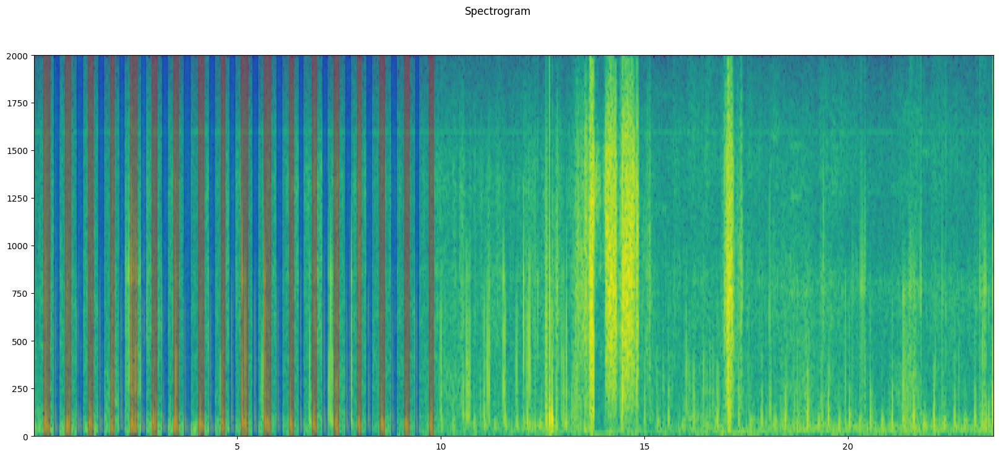

In [7]:
plot_specgram(waveform, sample_rate, s1_list=s1_ranges, s2_list=s2_ranges)

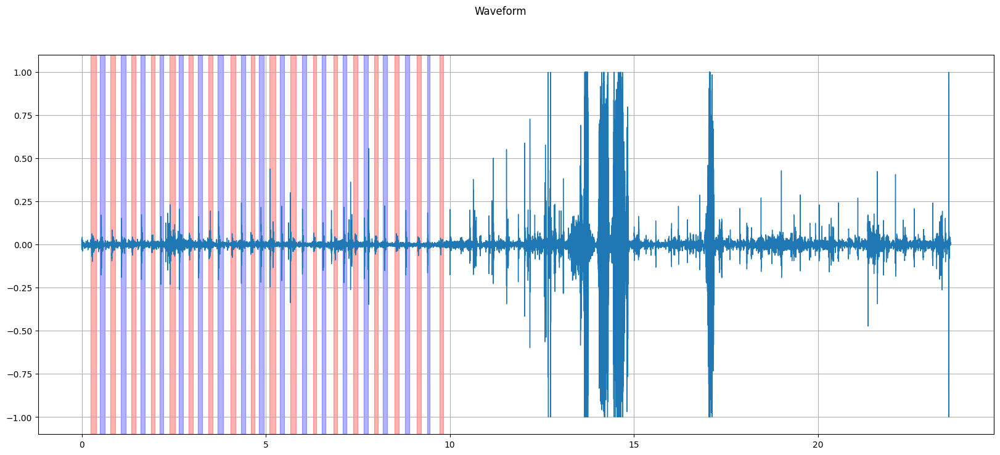

In [8]:
plot_waveform(waveform, sample_rate, s1_list=s1_ranges, s2_list=s2_ranges)

In [9]:
waveform, sample_rate = torchaudio.load('dataset/training_data/2530_MV.wav')

In [10]:
play_audio(waveform, sample_rate)

In [11]:
timetable = pd.read_csv('dataset/training_data/2530_MV.tsv', delimiter='\t', header=None)
timetable.head()

,0,1,2
0,0.000000,1.002750,0
1,1.002750,1.120238,1
2,1.120238,1.300238,2
3,1.300238,1.440238,3
4,1.440238,1.680238,4


In [12]:
s1_ranges = timetable[timetable[2] == 1][[0,1]].to_numpy()
s2_ranges = timetable[timetable[2] == 3][[0,1]].to_numpy()

s1_ranges

array([[ 1.00275 ,  1.120238],
       [ 1.680238,  1.780238],
       [ 2.660238,  2.760238],
       [ 3.05439 ,  3.180238],
       [ 3.740238,  3.900238],
       [ 4.380238,  4.480238],
       [ 4.920238,  5.020238],
       [ 5.434724,  5.560238],
       [ 5.980238,  6.080238],
       [ 6.520238,  6.620238],
       [ 7.040238,  7.160614],
       [ 7.540238,  7.660238],
       [ 8.040238,  8.140238],
       [ 8.540238,  8.640238],
       [ 9.080238,  9.180238],
       [ 9.640238,  9.760238],
       [10.220238, 10.340238],
       [10.720238, 10.840238],
       [11.260238, 11.360238],
       [11.800238, 11.920238],
       [12.400238, 12.500238],
       [13.000238, 13.120238],
       [13.551997, 13.690343],
       [14.080238, 14.200238],
       [14.600238, 14.720238],
       [15.117955, 15.240238],
       [15.660238, 15.760238],
       [16.200238, 16.320238],
       [16.734934, 16.860238],
       [17.256919, 17.360238],
       [17.760238, 17.880238],
       [18.276362, 18.380238],
       [

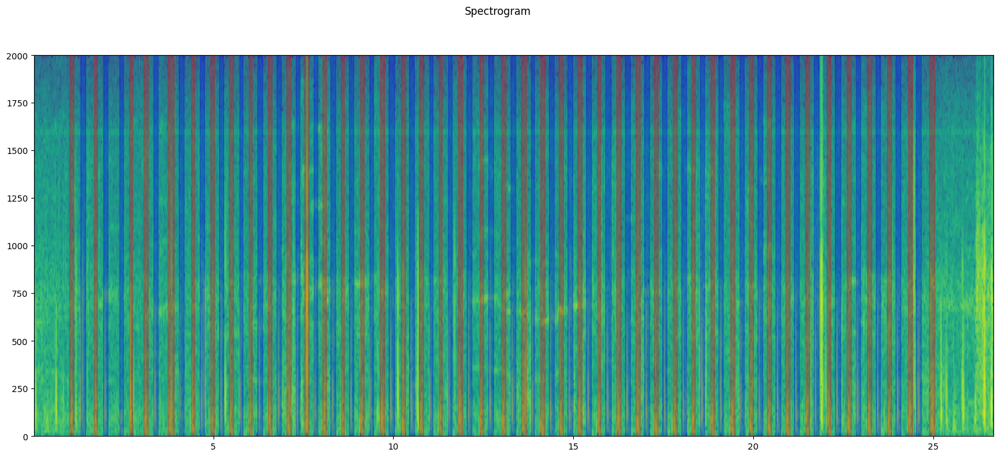

In [13]:
plot_specgram(waveform, sample_rate, s1_list=s1_ranges, s2_list=s2_ranges)

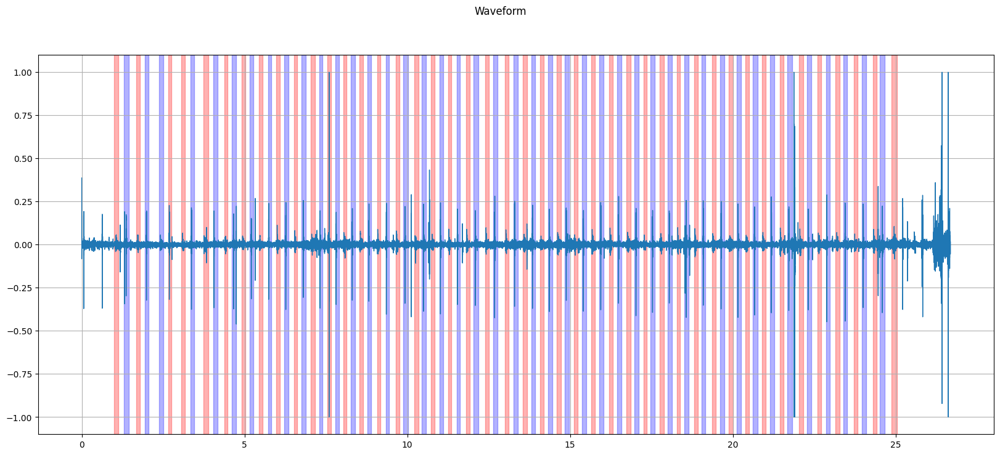

In [14]:
plot_waveform(waveform, sample_rate, s1_list=s1_ranges, s2_list=s2_ranges)

In [15]:
waveform, sample_rate = torchaudio.load('dataset/training_data/50654_PV.wav')

In [16]:
play_audio(waveform, sample_rate)

In [17]:
timetable = pd.read_csv('dataset/training_data/2530_MV.tsv', delimiter='\t', header=None)
timetable.head()

,0,1,2
0,0.000000,1.002750,0
1,1.002750,1.120238,1
2,1.120238,1.300238,2
3,1.300238,1.440238,3
4,1.440238,1.680238,4


In [18]:
s1_ranges = timetable[timetable[2] == 1][[0,1]].to_numpy()
s2_ranges = timetable[timetable[2] == 3][[0,1]].to_numpy()

s1_ranges

array([[ 1.00275 ,  1.120238],
       [ 1.680238,  1.780238],
       [ 2.660238,  2.760238],
       [ 3.05439 ,  3.180238],
       [ 3.740238,  3.900238],
       [ 4.380238,  4.480238],
       [ 4.920238,  5.020238],
       [ 5.434724,  5.560238],
       [ 5.980238,  6.080238],
       [ 6.520238,  6.620238],
       [ 7.040238,  7.160614],
       [ 7.540238,  7.660238],
       [ 8.040238,  8.140238],
       [ 8.540238,  8.640238],
       [ 9.080238,  9.180238],
       [ 9.640238,  9.760238],
       [10.220238, 10.340238],
       [10.720238, 10.840238],
       [11.260238, 11.360238],
       [11.800238, 11.920238],
       [12.400238, 12.500238],
       [13.000238, 13.120238],
       [13.551997, 13.690343],
       [14.080238, 14.200238],
       [14.600238, 14.720238],
       [15.117955, 15.240238],
       [15.660238, 15.760238],
       [16.200238, 16.320238],
       [16.734934, 16.860238],
       [17.256919, 17.360238],
       [17.760238, 17.880238],
       [18.276362, 18.380238],
       [

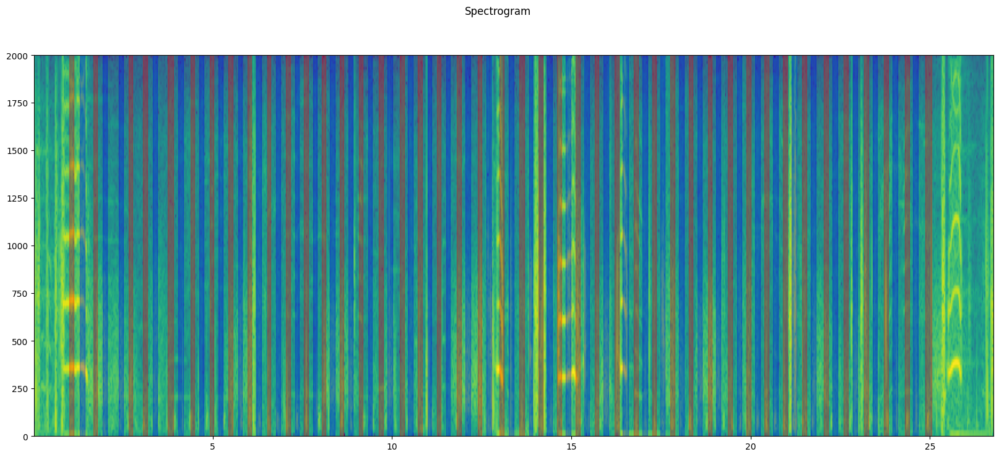

In [19]:
plot_specgram(waveform, sample_rate, s1_list=s1_ranges, s2_list=s2_ranges)

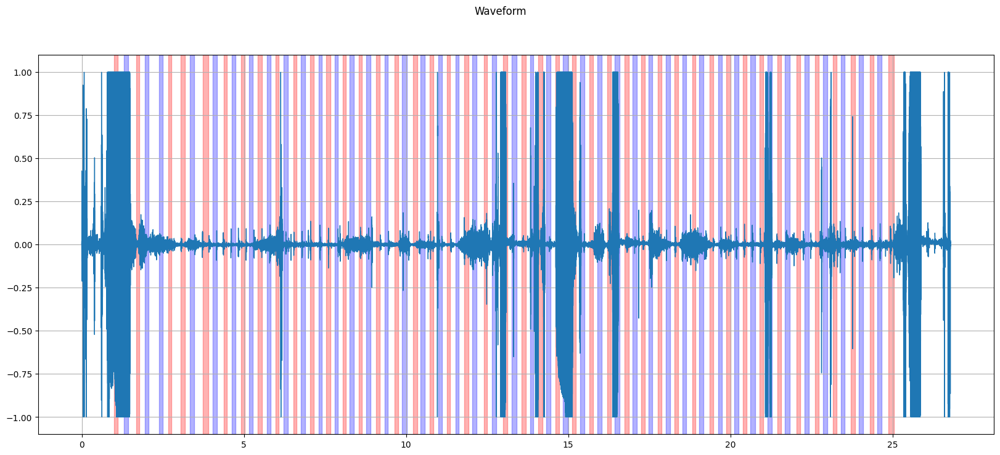

In [20]:
plot_waveform(waveform, sample_rate, s1_list=s1_ranges, s2_list=s2_ranges)

In [21]:
patients_df = pd.read_csv('dataset/data.csv')

patients_df.head()

,Unnamed: 0,id,AV,PV,TV,MV,Phc,Age,Sex,Height,...,Systolic murmur pitch,Systolic murmur quality,Diastolic murmur timing,Diastolic murmur shape,Diastolic murmur grading,Diastolic murmur pitch,Diastolic murmur quality,Outcome,Campaign,Additional ID
0,0,13918,True,True,True,True,False,Child,Male,98.0,...,Low,Blowing,NaN,NaN,NaN,NaN,NaN,Abnormal,CC2015,NaN
1,1,14241,True,True,True,True,False,Child,Male,87.0,...,Low,Harsh,NaN,NaN,NaN,NaN,NaN,Abnormal,CC2015,NaN
2,2,14998,True,True,True,True,False,Child,Male,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Abnormal,CC2015,NaN
3,3,23625,True,True,True,True,False,Child,Female,92.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Abnormal,CC2015,50379.0
4,4,24160,True,True,True,True,False,Child,Female,98.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Abnormal,CC2015,NaN


<Axes: >

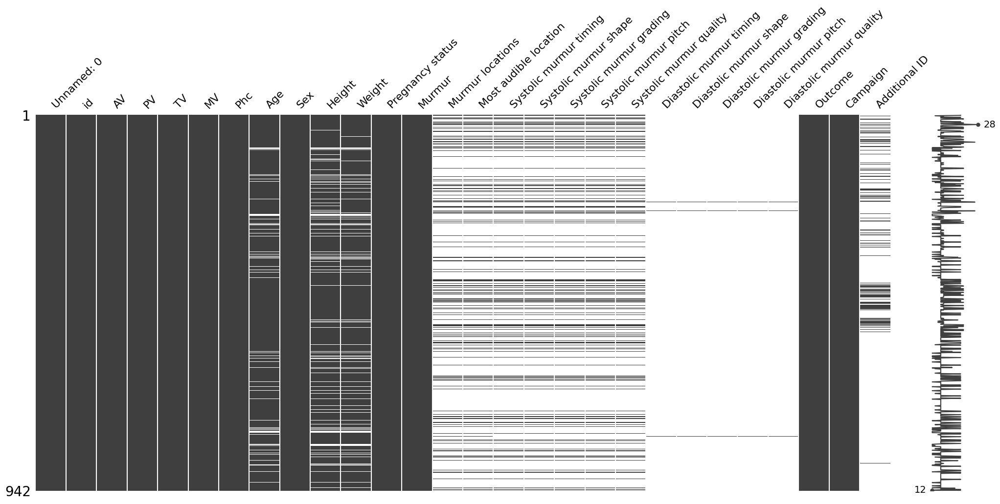

In [22]:
import missingno as msno

msno.matrix(patients_df)

In [23]:
patients_df.isna().sum()

Unnamed: 0                    0
id                            0
AV                            0
PV                            0
TV                            0
MV                            0
Phc                           0
Age                          74
Sex                           0
Height                      116
Weight                      105
Pregnancy status              0
Murmur                        0
Murmur locations            763
Most audible location       763
Systolic murmur timing      764
Systolic murmur shape       764
Systolic murmur grading     764
Systolic murmur pitch       764
Systolic murmur quality     764
Diastolic murmur timing     937
Diastolic murmur shape      937
Diastolic murmur grading    937
Diastolic murmur pitch      937
Diastolic murmur quality    937
Outcome                       0
Campaign                      0
Additional ID               802
dtype: int64

In [24]:
patients_df.groupby('Age').count()

,Unnamed: 0,id,AV,PV,TV,MV,Phc,Sex,Height,Weight,...,Systolic murmur pitch,Systolic murmur quality,Diastolic murmur timing,Diastolic murmur shape,Diastolic murmur grading,Diastolic murmur pitch,Diastolic murmur quality,Outcome,Campaign,Additional ID
Age,,,,,,,,,,,,,,,,,,,,,
Adolescent,72,72,72,72,72,72,72,72,66,66,...,16,16,3,3,3,3,3,72,72,13
Child,664,664,664,664,664,664,664,664,641,645,...,131,131,1,1,1,1,1,664,664,116
Infant,126,126,126,126,126,126,126,126,109,116,...,25,25,1,1,1,1,1,126,126,11
Neonate,6,6,6,6,6,6,6,6,6,6,...,1,1,0,0,0,0,0,6,6,0


In [25]:
patients_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 942 entries, 0 to 941
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                942 non-null    int64  
 1   id                        942 non-null    int64  
 2   AV                        942 non-null    bool   
 3   PV                        942 non-null    bool   
 4   TV                        942 non-null    bool   
 5   MV                        942 non-null    bool   
 6   Phc                       942 non-null    bool   
 7   Age                       868 non-null    object 
 8   Sex                       942 non-null    object 
 9   Height                    826 non-null    float64
 10  Weight                    837 non-null    float64
 11  Pregnancy status          942 non-null    bool   
 12  Murmur                    942 non-null    object 
 13  Murmur locations          179 non-null    object 
 14  Most audib

In [26]:
import os

def plot_waveforms(wav_list, title="waveform", xlim=None, ylim=None):
  figure, axes = plt.subplots(len(wav_list), 1, figsize=(20, 5 * len(wav_list)))
  
  if len(wav_list) == 1:
    axes = [axes]
  for c, wav in enumerate(wav_list):
    wav_path = os.path.abspath(f'./dataset/training_data/{wav}.wav')
    tsv_path = os.path.abspath(f'./dataset/training_data/{wav}.tsv')
    
    waveform, sample_rate = torchaudio.load(wav_path)
    waveform = waveform.numpy()
  
    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate
  
    axes[c].plot(time_axis, waveform[0], linewidth=1)
    axes[c].grid(True)
    if num_channels > 1:
      axes[c].set_ylabel(f'{wav_path}')
    if xlim:
      axes[c].set_xlim(xlim)
    if ylim:
      axes[c].set_ylim(ylim)
        
    timetable = pd.read_csv(tsv_path, delimiter='\t', header=None)
    s1_ranges = timetable[timetable[2] == 1][[0,1]].to_numpy()
    s2_ranges = timetable[timetable[2] == 3][[0,1]].to_numpy()
        
    if s1_ranges is not None:
      for i in range(s1_ranges.shape[0]):
        start, end = s1_ranges[i]
        axes[c].axvspan(start, end, color='red', alpha=0.3)
    
    if s2_ranges is not None:
      for i in range(s2_ranges.shape[0]):
        start, end = s2_ranges[i]
        axes[c].axvspan(start, end, color='blue', alpha=0.3)
      
    figure.suptitle(title)
  plt.tight_layout()
  plt.show(block=False)
  
  
def plot_specgrams(wav_list, title="Spectrogram", xlim=None):
  figure, axes = plt.subplots(len(wav_list), 1, figsize=(20, 5 * len(wav_list)))
  
  if len(wav_list) == 1:
    axes = [axes]
  for c, wav in enumerate(wav_list):
    wav_path = os.path.abspath(f'./dataset/training_data/{wav}.wav')
    tsv_path = os.path.abspath(f'./dataset/training_data/{wav}.tsv')
  
    waveform, sample_rate = torchaudio.load(wav_path)
    waveform = waveform.numpy()
  
    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate
  
    axes[c].specgram(waveform[0], Fs=sample_rate)
    if num_channels > 1:
      axes[c].set_ylabel(f'{wav_path}')
    if xlim:
      axes[c].set_xlim(xlim)
        
    timetable = pd.read_csv(tsv_path, delimiter='\t', header=None)
    s1_ranges = timetable[timetable[2] == 1][[0,1]].to_numpy()
    s2_ranges = timetable[timetable[2] == 3][[0,1]].to_numpy()
    
    if s1_ranges is not None:
      for i in range(s1_ranges.shape[0]):
        start, end = s1_ranges[i]
        axes[c].axvspan(start, end, color='red', alpha=0.3)
    
    if s2_ranges is not None:
      for i in range(s2_ranges.shape[0]):
        start, end = s2_ranges[i]
        axes[c].axvspan(start, end, color='blue', alpha=0.3)
      
    figure.suptitle(title)
  plt.tight_layout()
  plt.show(block=False)

In [27]:
patients_df[patients_df['Age'] == 'Neonate']['id'].iloc[:5].to_list()

[50636, 84731, 84732, 84784, 84804]

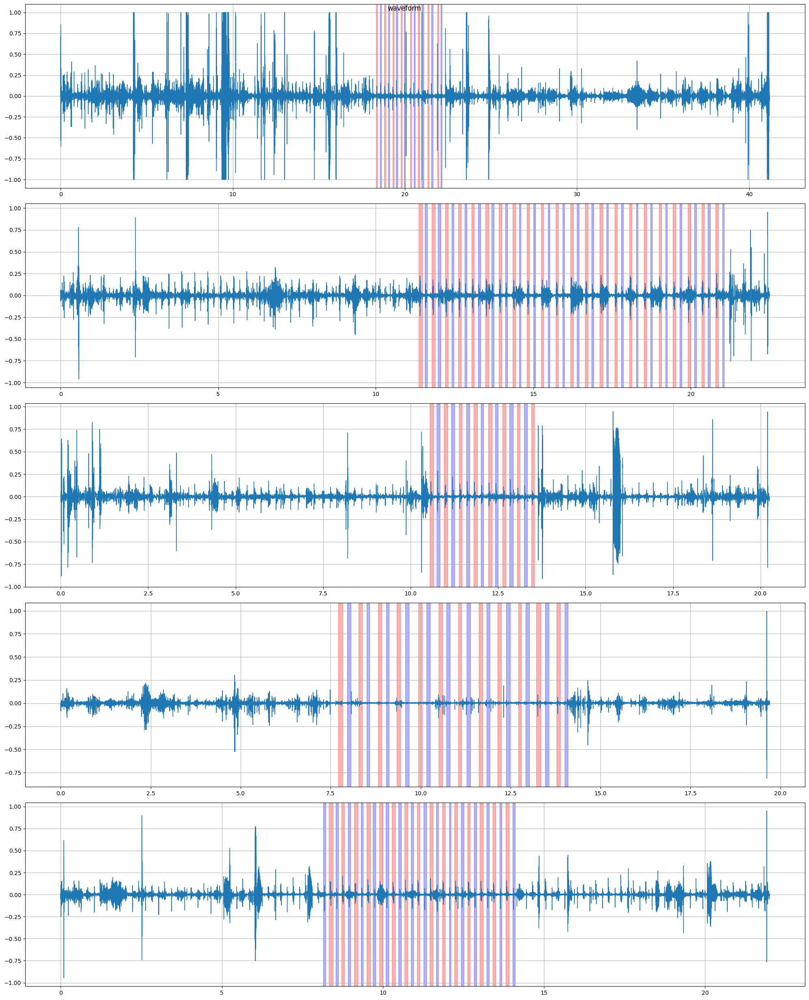

In [28]:
plot_waveforms(['50636_AV', '84731_MV', '84732_AV', '84784_AV', '84804_MV'])

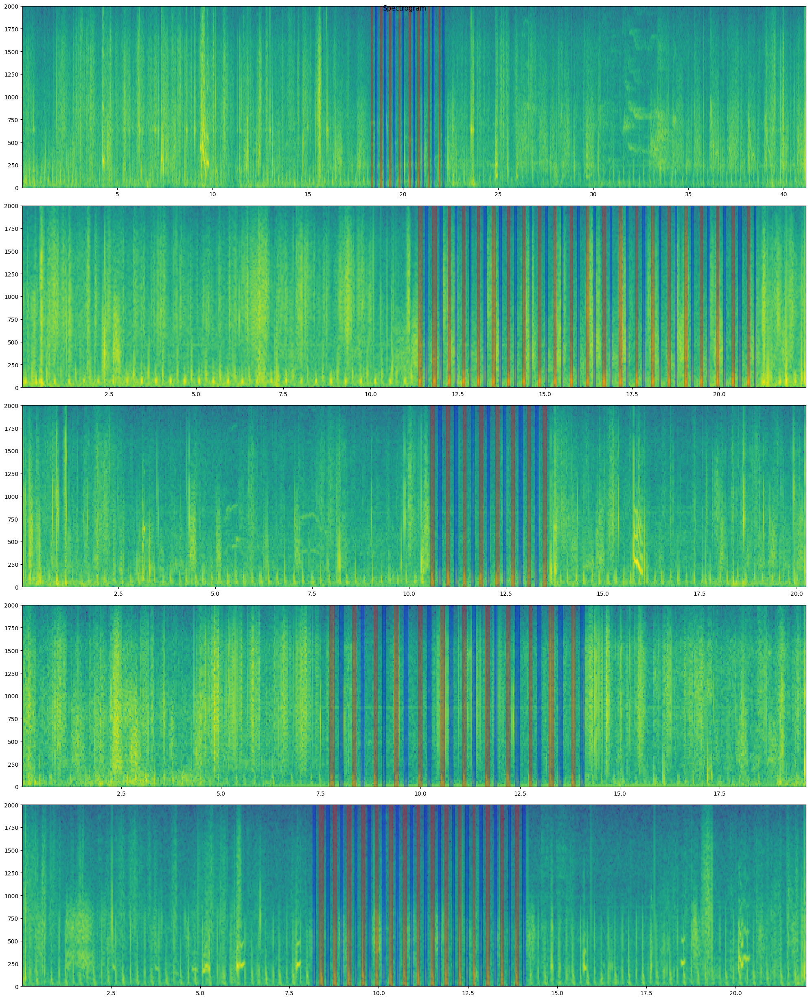

In [29]:
plot_specgrams(['50636_AV', '84731_MV', '84732_AV', '84784_AV', '84804_MV'])

In [30]:
import librosa

spectro = librosa.stft(waveform.numpy())

In [31]:
spectro.shape

(1, 1025, 210)

In [32]:
import numpy as np

np.abs(spectro)

array([[[4.94796419e+00, 6.07178736e+00, 3.50144124e+00, ...,
         1.14736357e+01, 9.28525925e+00, 4.51570415e+00],
        [4.43737936e+00, 4.35734034e+00, 1.38766515e+00, ...,
         6.03092813e+00, 5.28163767e+00, 4.24086905e+00],
        [3.27519512e+00, 2.86444497e+00, 6.64695680e-01, ...,
         7.35217273e-01, 1.23980367e+00, 3.29025292e+00],
        ...,
        [8.09221193e-02, 9.72823352e-02, 6.59160241e-02, ...,
         1.08885929e-01, 5.48669577e-01, 7.80296564e-01],
        [5.45015447e-02, 6.83576688e-02, 1.03013227e-02, ...,
         1.08036995e-01, 2.82732695e-01, 3.42801094e-01],
        [2.98006274e-02, 2.35347953e-02, 7.21671507e-02, ...,
         1.04650244e-01, 6.23494424e-02, 3.59271020e-02]]], dtype=float32)

In [33]:
spectro_mag = np.abs(spectro)
print(spectro_mag.min())
print(spectro_mag.max())
print(spectro_mag.mean())
print(spectro_mag.std())

4.494871e-06
336.5939
1.3830254
5.560241


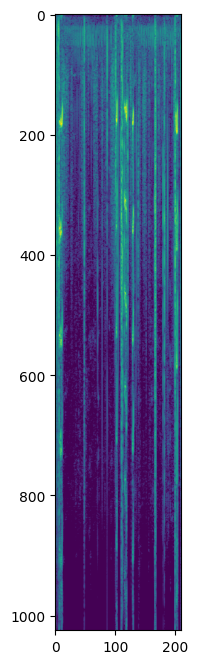

In [34]:
_, ax = plt.subplots(figsize=(20, 8))
ax.imshow(librosa.amplitude_to_db(np.abs(spectro)).reshape(1025, 210))

In [35]:
spectro_phase = np.angle(spectro)
print(spectro_phase.min())
print(spectro_phase.max())
print(spectro_phase.mean())
print(spectro_phase.std())

-3.141508
3.1415927
0.0018815453
1.8146553


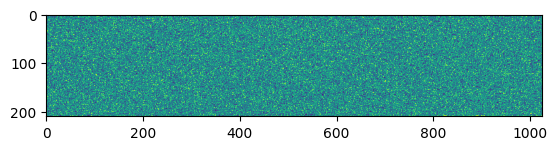

In [36]:
plt.imshow(spectro_phase.reshape(210, 1025))

In [37]:
mel_spectro = librosa.feature.melspectrogram(y=waveform.numpy(), sr=sample_rate)
mel_spectro.shape

(1, 128, 210)

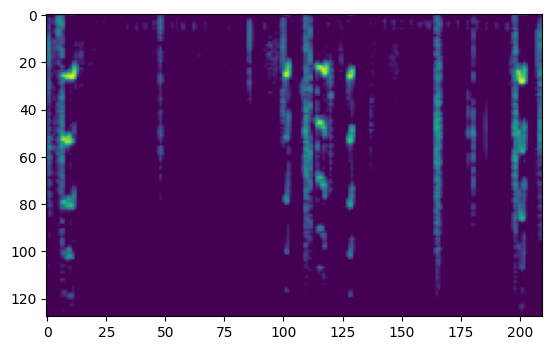

In [38]:
plt.imshow(librosa.amplitude_to_db(mel_spectro).reshape(128, 210))

C:\Users\AI-STEELBEAR\AppData\Local\Temp\ipykernel_2916\988911870.py:1: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  librosa.display.specshow(spectro[0], sr=sample_rate, x_axis='time', y_axis='linear')


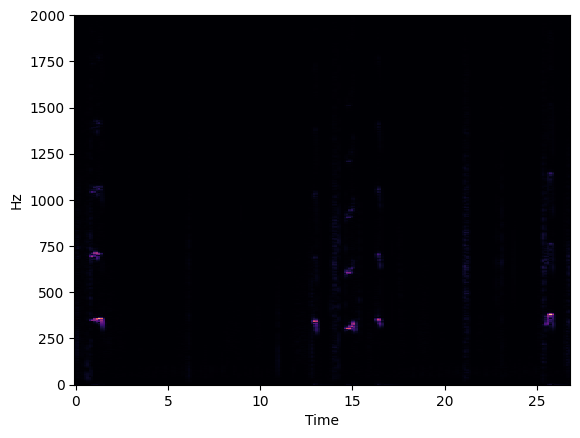

In [49]:
librosa.display.specshow(spectro[0], sr=sample_rate, x_axis='time', y_axis='linear')

In [52]:
display(Audio(waveform, rate=sample_rate))

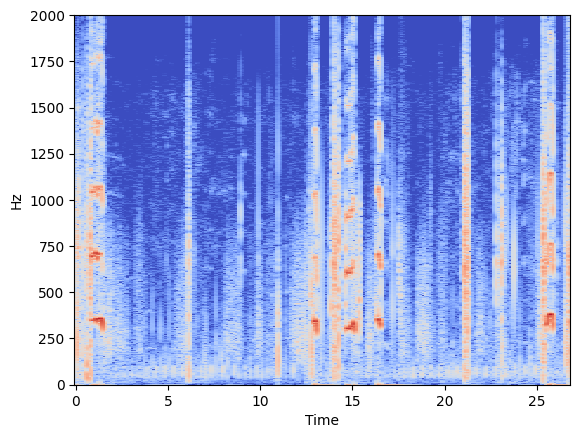

In [55]:
librosa.display.specshow(librosa.amplitude_to_db(spectro_mag[0]), sr=sample_rate, x_axis='time', y_axis='linear')

In [56]:
librosa.amplitude_to_db(spectro_mag[0]).shape

(1025, 210)